In [ ]:
# Restart the Python process on Databricks
dbutils.library.restartPython()

# Imports

In [ ]:
import math
import os

import cv2
import geopandas as gpd
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import pyproj
import seaborn as sns
import tensorflow as tf
from azure_blobstorage_utils import BlobStorageExtended
from PIL import Image
from sklearn.metrics import (
    accuracy_score,
    auc,
    confusion_matrix,
    f1_score,
    precision_score,
    recall_score,
    roc_curve,
)
from sklearn.model_selection import train_test_split
from tensorflow.keras.applications import ResNet50
from tensorflow.keras.layers import Dense
from tensorflow.keras.metrics import AUC
from tensorflow.keras.models import Model
from tensorflow.keras.preprocessing.image import ImageDataGenerator

Image.MAX_IMAGE_PIXELS = 625000000

# Use first GPU
os.environ["CUDA_VISIBLE_DEVICES"] = "0"

# Hackathon Program

The following is the hackathon program, each question is independant from other ones. You are not blocked if you can't finish one question !

## I - Collect & display all french airports

**Objective:** visualize all french airports

**Deliverables:**
- French airports list
- Map of the french airports
- Filters/Metadata : number of runways, runway types, all metadatas that you can find !
- A PowerBI to display your results

**Comments:**
You are completely autonomous for this question & free to find all open data that seems relevant to answer the question.


## II - Extract airports & runway images

### II.1 - Extract airports images

**Objective:** Extract croped images of french airports  

**Deliverables:**
- Python code 
- Cropped images of airports

**Comments:**
You are given the following :
- French Ortho Photos (collection of photos of french territory taken from a plane, 1 pixel = 20cm x 20cm)
- Airports geolocalization

You are expected to use both to extract crops of french airports.

In [ ]:
source_blob_helper = BlobStorageExtended(source_storage_connection_string)

departement_code = "062"  # filter on departement (Pas de Calais here)
file_list = source_blob_helper.get_list_blobs_name(
    container_name,
    prefix=f"ORTHOHR/ORTHOHR_1-0_RVB-0M20_JP2-E080_LAMB93_D{departement_code}",
)
print(
    file_list
)  # each departement directory contains .jp2 (high res jpeg) & .tab files. Tab files are text files that gives the coordinates (in Lambert 93) of the corresponding image.

Using path: [azure_tmp/] as local storage
['ORTHOHR/ORTHOHR_1-0_RVB-0M20_JP2-E080_LAMB93_D062_2018-01-01/ORTHOHR/1_DONNEES_LIVRAISON_2020-08-00027/OHR_RVB_0M20_JP2-E080_LAMB93_D62-2018.md5', 'ORTHOHR/ORTHOHR_1-0_RVB-0M20_JP2-E080_LAMB93_D062_2018-01-01/ORTHOHR/1_DONNEES_LIVRAISON_2020-08-00027/OHR_RVB_0M20_JP2-E080_LAMB93_D62-2018/62-2018-0595-7035-LA93-0M20-E080.jp2', 'ORTHOHR/ORTHOHR_1-0_RVB-0M20_JP2-E080_LAMB93_D062_2018-01-01/ORTHOHR/1_DONNEES_LIVRAISON_2020-08-00027/OHR_RVB_0M20_JP2-E080_LAMB93_D62-2018/62-2018-0595-7035-LA93-0M20-E080.tab', 'ORTHOHR/ORTHOHR_1-0_RVB-0M20_JP2-E080_LAMB93_D062_2018-01-01/ORTHOHR/1_DONNEES_LIVRAISON_2020-08-00027/OHR_RVB_0M20_JP2-E080_LAMB93_D62-2018/62-2018-0595-7040-LA93-0M20-E080.jp2', 'ORTHOHR/ORTHOHR_1-0_RVB-0M20_JP2-E080_LAMB93_D062_2018-01-01/ORTHOHR/1_DONNEES_LIVRAISON_2020-08-00027/OHR_RVB_0M20_JP2-E080_LAMB93_D62-2018/62-2018-0595-7040-LA93-0M20-E080.tab', 'ORTHOHR/ORTHOHR_1-0_RVB-0M20_JP2-E080_LAMB93_D062_2018-01-01/ORTHOHR/1_DONNEES_LIVRAISON_2020-08-00027/OHR_RVB_0M20_JP2-E080_LAMB93_D62-2018/62-2018-0595-7045-LA93-0M20-E080.jp2', 'ORTHOHR/ORTHOHR_1-0_RVB-0M20_JP2-E080_LAMB93_D062_2018-01-01/ORTHOHR/1_DONNEES_LIVRAISON_2020-08-00027/OHR_RVB_0M20_JP2-E080_LAMB93_D62-2018/62-2018-0595-7045-LA93-0M20-E080.tab', 'ORTHOHR/ORTHOHR_1-0_RVB-0M20_JP2-E080_LAMB93_D062_2018-01-01/ORTHOHR/1_DONNEES_LIVRAISON_2020-08-00027/OHR_RVB_0M20_JP2-E080_LAMB93_D62-2018/62-2018-0595-7050-LA93-0M20-E080.jp2', 'ORTHOHR/ORTHOHR_1-0_RVB-0M20_JP2-E080_LAMB93_D062_2018-01-01/ORTHOHR/1_DONNEES_LIVRAISON_2020-08-00027/OHR_RVB_0M20_JP2-E080_LAMB93_D62-2018/62-2018-0595-7050-LA93-0M20-E080.tab', 'ORTHOHR/ORTHOHR_1-0_RVB-0M20_JP2-E080_LAMB93_D062_2018-01-01/ORTHOHR/1_DONNEES_LIVRAISON_2020-08-00027/OHR_RVB_0M20_JP2-E080_LAMB93_D62-2018/62-2018-0595-7055-LA93-0M20-E080.jp2', 'ORTHOHR/ORTHOHR_1-0_RVB-0M20_JP2-E080_LAMB93_D062_2018-01-01/ORTHOHR/1_DONNEES_LIVRAISON_2020-08-00027/OHR_RVB_0M20_JP2-E080_LAMB93_D62-2018/62-2018-0595-7055-LA93-0M20-E080.tab', 'ORTHOHR/ORTHOHR_1-0_RVB-0M20_JP2-E080_LAMB93_D062_2018-01-01/ORTHOHR/1_DONNEES_LIVRAISON_2020-08-00027/OHR_RVB_0M20_JP2-E080_LAMB93_D62-2018/62-2018-0595-7060-LA93-0M20-E080.jp2', 'ORTHOHR/ORTHOHR_1-0_RVB-0M20_JP2-E080_LAMB93_D062_2018-01-01/ORTHOHR/1_DONNEES_LIVRAISON_2020-08-00027/OHR_RVB_0M20_JP2-E080_LAMB93_D62-2018/62-2018-0595-7060-LA93-0M20-E080.tab', 'ORTHOHR/ORTHOHR_1-0_RVB-0M20_JP2-E080_LAMB93_D062_2018-01-01/ORTHOHR/1_DONNEES_LIVRAISON_2020-08-00027/OHR_RVB_0M20_JP2-E080_LAMB93_D62-2018/62-2018-0595-7065-LA93-0M20-E080.jp2', 'ORTHOHR/ORTHOHR_1-0_RVB-0M20_JP2-E080_LAMB93_D062_2018-01-01/ORTHOHR/1_DONNEES_LIVRAISON_2020-08-00027/OHR_RVB_0M20_JP2-E080_LAMB93_D62-2018/62-2018-0595-7065-LA93-0M20-E080.tab', 'ORTHOHR/ORTHOHR_1-0_RVB-0M20_JP2-E080_LAMB93_D062_2018-01-01/ORTHOHR/1_DONNEES_LIVRAISON_2020-08-00027/OHR_RVB_0M20_JP2-E080_LAMB93_D62-2018/62-2018-0595-7070-LA93-0M20-E080.jp2', 'ORTHOHR/ORTHOHR_1-0_RVB-0M20_JP2-E080_LAMB93_D062_2018-01-01/ORTHOHR/1_DONNEES_LIVRAISON_2020-08-00027/OHR_RVB_0M20_JP2-E080_LAMB93_D62-2018/62-2018-0595-7070-LA93-0M20-E080.tab', 'ORTHOHR/ORTHOHR_1-0_RVB-0M20_JP2-E080_LAMB93_D062_2018-01-01/ORTHOHR/1_DONNEES_LIVRAISON_2020-08-00027/OHR_RVB_0M20_JP2-E080_LAMB93_D62-2018/62-2018-0595-7075-LA93-0M20-E080.jp2', 'ORTHOHR/ORTHOHR_1-0_RVB-0M20_JP2-E080_LAMB93_D062_2018-01-01/ORTHOHR/1_DONNEES_LIVRAISON_2020-08-00027/OHR_RVB_0M20_JP2-E080_LAMB93_D62-2018/62-2018-0595-7075-LA93-0M20-E080.tab', 'ORTHOHR/ORTHOHR_1-0_RVB-0M20_JP2-E080_LAMB93_D062_2018-01-01/ORTHOHR/1_DONNEES_LIVRAISON_2020-08-00027/OHR_RVB_0M20_JP2-E080_LAMB93_D62-2018/62-2018-0595-7085-LA93-0M20-E080.jp2', 'ORTHOHR/ORTHOHR_1-0_RVB-0M20_JP2-E080_LAMB93_D062_2018-01-01/ORTHOHR/1_DONNEES_LIVRAISON_2020-08-00027/OHR_RVB_0M20_JP2-E080_LAMB93_D62-2018/62-2018-0595-7085-LA93-0M20-E080.tab', 'ORTHOHR/ORTHOHR_1-0_RVB-0M20_JP2-E080_LAMB93_D062_2018-01-01/ORTHOHR/1_DONNEES_LIVRAISON_2020-08-00027/OHR_RVB_0M20_JP2-E080_LAMB93_D62-2018/62-2018-0595-7090-LA93-0M20-E080.jp2', 'ORTHOHR

Downloading airports_metadata/airports_fr.geojson to azure_tmp/airports_fr.geojson

,ID,NATURE,DESSERTE,TOPONYME,geometry
0,BDCAEROD0000000017183146,Normal,Non desservi,aérodrome de buno-bonnevaux,"POLYGON ((657327.300 6805339.400, 657235.500 6..."
1,BDCAEROD0000000017183145,Normal,Non desservi,aérodrome d'étampes-mondésir,"POLYGON ((631480.700 6808504.400, 631150.100 6..."
2,BDCAEROD0000000017183142,Normal,Non desservi,aérodrome de moret-épisy,"POLYGON ((685135.800 6804108.800, 685000.100 6..."
3,BDCAEROD0000000017183144,Normal,Non desservi,aérodrome jean-baptiste salis,"POLYGON ((650859.800 6821897.100, 650589.000 6..."
4,BDCAEROD0000000017183101,Normal,Non desservi,aérodrome de chavenay-villepreux,"POLYGON ((624910.800 6860973.100, 625365.500 6..."
...,...,...,...,...,...
626,BDCAEROD0000000017183521,Normal,Desservi,aéroport d'ajaccio-napoléon bonaparte,"POLYGON ((1181645.700 6107088.200, 1181578.200..."
627,BDCAEROD0000000017183494,Normal,Non desservi,aérodrome de corte,"POLYGON ((1211229.500 6152135.700, 1211176.400..."
628,BDCAEROD0000002004977542,Normal,Non desservi,héliport militaire,"POLYGON ((1229387.500 6087437.300, 1229422.800..."
629,BDCAEROD0000002004997300,Normal,Non desservi,héliport centre hospitalier de bastia,"POLYGON ((1226922.200 6197309.800, 1226921.300..."


Out[5]:

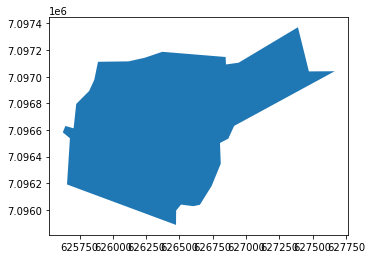

<AxesSubplot:>

In [ ]:
# Get airports localization

source_blob_helper.download_file(
    container_name, "airports_metadata/airports_fr.geojson", "airports_fr.geojson"
)
airports = gpd.read_file("azure_tmp/airports_fr.geojson")
display(airports)
airports[airports["ID"] == "BDCAEROD0000000017182996"].plot()

You have orthophoto like this one

![Département](/files/hackathon/orhto_pas_de_calais.png)

And airport localization like that

![Emprise au sol](/files/hackathon/calais_emprise_au_sol.png)

You are expected to crop airport image like that

![Aéroport Calais](/files/hackathon/BDCAEROD0000000017182996_ae_roport_de_calais_dunkerque.jpg)

In [ ]:
# YOUR CODE HERE
# If you want to upload files to storage use destination blob helper
destination_blob_helper = BlobStorageExtended(destination_storage_connection_string)

# Usage
# destination_blob_helper.upload_file(container_name, local_file_name=.., remote_file_name=...)

Using path: [azure_tmp/] as local storage

In [ ]:
# Download all the tab files which contain the information of the images
# Put the data of the images in a dataframe

image_tab = [
    filename
    for filename in source_blob_helper.get_list_blobs_name(
        container_name, prefix="ORTHOHR/"
    )
    if filename.endswith(".tab")
]

x = 0
delimiter = "\t"
concatenated_df = pd.DataFrame()

for i in image_tab:
    source_blob_helper.download_file(container_name, image_tab[x])
    file_path = open(f"azure_tmp/{image_tab[x]}")
    df = pd.read_csv(file_path, delimiter, header=None)
    df = df.transpose()
    concatenated_df = pd.concat([concatenated_df, df], ignore_index=True)
    x = x + 1

# leave only the needed columns

columns_to_keep = [4, 6, 7, 8, 9]
concatenated_df = concatenated_df[columns_to_keep]


# Function to retieve the file name from the string
def retrieve_file_name(s):
    s = s[6:-1]
    return s


# Apply the function on the column that contains the file names
concatenated_df[4] = concatenated_df[4].apply(retrieve_file_name)

# Change the name of the column
concatenated_df = concatenated_df.rename(columns={4: "image_id"})

# Retrieve the coordinates from label
concatenated_df[6] = concatenated_df[6].str.extract(r"\((.*?)\)")
concatenated_df[7] = concatenated_df[7].str.extract(r"\((.*?)\)")
concatenated_df[8] = concatenated_df[8].str.extract(r"\((.*?)\)")
concatenated_df[9] = concatenated_df[9].str.extract(r"\((.*?)\)")

# Devide the coordiantes in Xs and Ys
concatenated_df[["X_0_0", "Y_0_0"]] = concatenated_df[6].str.split(",", expand=True)
concatenated_df[["X_1_0", "Y_1_0"]] = concatenated_df[7].str.split(",", expand=True)
concatenated_df[["X_1_1", "Y_1_1"]] = concatenated_df[8].str.split(",", expand=True)
concatenated_df[["X_0_1", "Y_0_1"]] = concatenated_df[9].str.split(",", expand=True)

# Leave only image_id, X_min, X_max, Y_min, Y_max
columns_to_delete = [6, 7, 8, 9, "Y_1_0", "X_1_1", "Y_0_1", "X_0_1"]
concatenated_df = concatenated_df.drop(columns=columns_to_delete, axis=1)
concatenated_df = concatenated_df.rename(
    columns={"X_0_0": "X_min", "X_1_0": "X_max", "Y_0_0": "Y_max", "Y_1_1": "Y_min"}
)

# Transform coordinates to numeric
concatenated_df["X_min"] = pd.to_numeric(concatenated_df["X_min"])
concatenated_df["Y_max"] = pd.to_numeric(concatenated_df["Y_max"])
concatenated_df["X_max"] = pd.to_numeric(concatenated_df["X_max"])
concatenated_df["Y_min"] = pd.to_numeric(concatenated_df["Y_min"])
concatenated_df

Downloading ORTHOHR/ORTHOHR_1-0_RVB-0M20_JP2-E080_LAMB93_D001_2018-01-01/ORTHOHR/1_DONNEES_LIVRAISON_2020-07-00380/OHR_RVB_0M20_JP2-E080_LAMB93_D01-2018/01-2018-0830-6540-LA93-0M20-E080.tab to azure_tmp/ORTHOHR/ORTHOHR_1-0_RVB-0M20_JP2-E080_LAMB93_D001_2018-01-01/ORTHOHR/1_DONNEES_LIVRAISON_2020-07-00380/OHR_RVB_0M20_JP2-E080_LAMB93_D01-2018/01-2018-0830-6540-LA93-0M20-E080.tab
Downloading ORTHOHR/ORTHOHR_1-0_RVB-0M20_JP2-E080_LAMB93_D001_2018-01-01/ORTHOHR/1_DONNEES_LIVRAISON_2020-07-00380/OHR_RVB_0M20_JP2-E080_LAMB93_D01-2018/01-2018-0830-6545-LA93-0M20-E080.tab to azure_tmp/ORTHOHR/ORTHOHR_1-0_RVB-0M20_JP2-E080_LAMB93_D001_2018-01-01/ORTHOHR/1_DONNEES_LIVRAISON_2020-07-00380/OHR_RVB_0M20_JP2-E080_LAMB93_D01-2018/01-2018-0830-6545-LA93-0M20-E080.tab
Downloading ORTHOHR/ORTHOHR_1-0_RVB-0M20_JP2-E080_LAMB93_D001_2018-01-01/ORTHOHR/1_DONNEES_LIVRAISON_2020-07-00380/OHR_RVB_0M20_JP2-E080_LAMB93_D01-2018/01-2018-0830-6550-LA93-0M20-E080.tab to azure_tmp/ORTHOHR/ORTHOHR_1-0_RVB-0M20_JP2-E080_LAMB93_D001_2018-01-01/ORTHOHR/1_DONNEES_LIVRAISON_2020-07-00380/OHR_RVB_0M20_JP2-E080_LAMB93_D01-2018/01-2018-0830-6550-LA93-0M20-E080.tab
Downloading ORTHOHR/ORTHOHR_1-0_RVB-0M20_JP2-E080_LAMB93_D001_2018-01-01/ORTHOHR/1_DONNEES_LIVRAISON_2020-07-00380/OHR_RVB_0M20_JP2-E080_LAMB93_D01-2018/01-2018-0830-6555-LA93-0M20-E080.tab to azure_tmp/ORTHOHR/ORTHOHR_1-0_RVB-0M20_JP2-E080_LAMB93_D001_2018-01-01/ORTHOHR/1_DONNEES_LIVRAISON_2020-07-00380/OHR_RVB_0M20_JP2-E080_LAMB93_D01-2018/01-2018-0830-6555-LA93-0M20-E080.tab
Downloading ORTHOHR/ORTHOHR_1-0_RVB-0M20_JP2-E080_LAMB93_D001_2018-01-01/ORTHOHR/1_DONNEES_LIVRAISON_2020-07-00380/OHR_RVB_0M20_JP2-E080_LAMB93_D01-2018/01-2018-0830-6560-LA93-0M20-E080.tab to azure_tmp/ORTHOHR/ORTHOHR_1-0_RVB-0M20_JP2-E080_LAMB93_D001_2018-01-01/ORTHOHR/1_DONNEES_LIVRAISON_2020-07-00380/OHR_RVB_0M20_JP2-E080_LAMB93_D01-2018/01-2018-0830-6560-LA93-0M20-E080.tab
Downloading ORTHOHR/ORTHOHR_1-0_RVB-0M20_JP2-E080_LAMB93_D001_2018-01-01/ORTHOHR/1_DONNEES_LIVRAISON_2020-07-00380/OHR_RVB_0M20_JP2-E080_LAMB93_D01-2018/01-2018-0835-6535-LA93-0M20-E080.tab to azure_tmp/ORTHOHR/ORTHOHR_1-0_RVB-0M20_JP2-E080_LAMB93_D001_2018-01-01/ORTHOHR/1_DONNEES_LIVRAISON_2020-07-00380/OHR_RVB_0M20_JP2-E080_LAMB93_D01-2018/01-2018-0835-6535-LA93-0M20-E080.tab
Downloading ORTHOHR/ORTHOHR_1-0_RVB-0M20_JP2-E080_LAMB93_D001_2018-01-01/ORTHOHR/1_DONNEES_LIVRAISON_2020-07-00380/OHR_RVB_0M20_JP2-E080_LAMB93_D01-2018/01-2018-0835-6540-LA93-0M20-E080.tab to azure_tmp/ORTHOHR/ORTHOHR_1-0_RVB-0M20_JP2-E080_LAMB93_D001_2018-01-01/ORTHOHR/1_DONNEES_LIVRAISON_2020-07-00380/OHR_RVB_0M20_JP2-E080_LAMB93_D01-2018/01-2018-0835-6540-LA93-0M20-E080.tab
Downloading ORTHOHR/ORTHOHR_1-0_RVB-0M20_JP2-E080_LAMB93_D001_2018-01-01/ORTHOHR/1_DONNEES_LIVRAISON_2020-07-00380/OHR_RVB_0M20_JP2-E080_LAMB93_D01-2018/01-2018-0835-6545-LA93-0M20-E080.tab to azure_tmp/ORTHOHR/ORTHOHR_1-0_RVB-0M20_JP2-E080_LAMB93_D001_2018-01-01/ORTHOHR/1_DONNEES_LIVRAISON_2020-07-00380/OHR_RVB_0M20_JP2-E080_LAMB93_D01-2018/01-2018-0835-6545-LA93-0M20-E080.tab
Downloading ORTHOHR/ORTHOHR_1-0_RVB-0M20_JP2-E080_LAMB93_D001_2018-01-01/ORTHOHR/1_DONNEES_LIVRAISON_2020-07-00380/OHR_RVB_0M20_JP2-E080_LAMB93_D01-2018/01-2018-0835-6550-LA93-0M20-E080.tab to azure_tmp/ORTHOHR/ORTHOHR_1-0_RVB-0M20_JP2-E080_LAMB93_D001_2018-01-01/ORTHOHR/1_DONNEES_LIVRAISON_2020-07-00380/OHR_RVB_0M20_JP2-E080_LAMB93_D01-2018/01-2018-0835-6550-LA93-0M20-E080.tab
Downloading ORTHOHR/ORTHOHR_1-0_RVB-0M20_JP2-E080_LAMB93_D001_2018-01-01/ORTHOHR/1_DONNEES_LIVRAISON_2020-07-00380/OHR_RVB_0M20_JP2-E080_LAMB93_D01-2018/01-2018-0835-6555-LA93-0M20-E080.tab to azure_tmp/ORTHOHR/ORTHOHR_1-0_RVB-0M20_JP2-E080_LAMB93_D001_2018-01-01/ORTHOHR/1_DONNEES_LIVRAISON_2020-07-00380/OHR_RVB_0M20_JP2-E080_LAMB93_D01-2018/01-2018-0835-6555-LA93-0M20-E080.tab
Downloading ORTHOHR/ORTHOHR_1-0_RVB-0M20_JP2-E080_LAMB93_D001_2018-01-01/ORTHOHR/1_DONNEES_LIVRAISON_2020-07-00380/OHR_RVB_0M20_JP2-E080_LAMB93_D01-2018/01-2018-0835-6560-LA93-0M20-E080.tab 

,image_id,X_min,Y_max,X_max,Y_min
0,01-2018-0830-6540-LA93-0M20-E080.jp2,830000.0,6540000.0,835000.0,6535000.0
1,01-2018-0830-6545-LA93-0M20-E080.jp2,830000.0,6545000.0,835000.0,6540000.0
2,01-2018-0830-6550-LA93-0M20-E080.jp2,830000.0,6550000.0,835000.0,6545000.0
3,01-2018-0830-6555-LA93-0M20-E080.jp2,830000.0,6555000.0,835000.0,6550000.0
4,01-2018-0830-6560-LA93-0M20-E080.jp2,830000.0,6560000.0,835000.0,6555000.0
...,...,...,...,...,...
28012,95-2018-0665-6885-LA93-0M20-E080.jp2,665000.0,6885000.0,670000.0,6880000.0
28013,95-2018-0665-6890-LA93-0M20-E080.jp2,665000.0,6890000.0,670000.0,6885000.0
28014,95-2018-0665-6895-LA93-0M20-E080.jp2,665000.0,6895000.0,670000.0,6890000.0
28015,95-2018-0670-6885-LA93-0M20-E080.jp2,670000.0,6885000.0,675000.0,6880000.0


In [ ]:
# Create a dataframe that contains airports IDs and their coordinates
airports_coords = airports["geometry"].get_coordinates()
airports_coords.index.name = "index"
a = airports_coords.groupby("index")["x"].apply(list)
b = airports_coords.groupby("index")["y"].apply(list)
airports_coords = pd.concat([a, b], axis=1)
airports_final = pd.concat([airports["ID"], airports_coords], axis=1)


def max_in_list(x):
    return max(x)


def min_in_list(y):
    return min(y)


# Apply the function to create a new column
airports_final["max_in_list_x"] = airports_final["x"].apply(max_in_list)
airports_final["min_in_list_x"] = airports_final["x"].apply(min_in_list)
airports_final["max_in_list_y"] = airports_final["y"].apply(max_in_list)
airports_final["min_in_list_y"] = airports_final["y"].apply(min_in_list)
display(airports_final)

ID,x,y,max_in_list_x,min_in_list_x,max_in_list_y,min_in_list_y
BDCAEROD0000000017183146,"List(657327.300000008, 657235.500000008, 657279.500000008, 657210.200000008, 656806.1000000081, 656771.8000000082, 656841.000000008, 657285.200000008, 657330.500000008, 657460.2000000079, 657433.0000000079, 657615.6000000079, 657617.1000000079, 657685.1000000079, 657563.300000008, 657438.1000000079, 657416.300000008, 657341.000000008, 657327.300000008)","List(6805339.400001095, 6805353.100001094, 6805594.600001094, 6805675.100001093, 6805740.500001093, 6805823.7000010945, 6805852.100001091, 6805795.400001092, 6805955.900001093, 6805929.900001094, 6805788.200001093, 6805748.700001093, 6805570.800001094, 6805459.300001094, 6805476.300001095, 6805437.400001094, 6805461.500001094, 6805423.2000010945, 6805339.400001095)",657685.1000000079,656771.8000000082,6805955.900001093,6805339.400001095
BDCAEROD0000000017183145,"List(631480.7000000126, 631150.1000000128, 631010.7000000128, 630771.900000013, 630403.800000013, 630689.7000000128, 630869.3000000129, 630964.9000000128, 631638.3000000126, 631792.8000000127, 632048.1000000125, 632393.9000000126, 632357.5000000126, 632222.7000000125, 632147.0000000126, 632007.5000000126, 631787.8000000127, 631713.8000000127, 631637.7000000126, 631591.6000000127, 631560.4000000127, 631525.2000000126, 631480.7000000126)","List(6808504.400001086, 6808529.200001085, 6808705.300001085, 6808714.300001087, 6808676.400001085, 6809044.700001085, 6809238.100001083, 6809326.200001082, 6809902.200001082, 6809845.000001083, 6809662.900001083, 6809071.400001083, 6809029.800001084, 6808920.000001086, 6808827.600001085, 6808634.900001085, 6808661.800001086, 6808650.400001084, 6808639.000001086, 6808615.400001085, 6808593.700001086, 6808564.000001085, 6808504.400001086)",632393.9000000126,630403.800000013,6809902.200001082,6808504.400001086
BDCAEROD0000000017183142,"List(685135.8000000028, 685000.1000000028, 684728.9000000029, 684605.2000000029, 684767.1000000028, 684723.9000000029, 684879.4000000028, 684793.1000000028, 684901.1000000028, 685106.4000000028, 685131.5000000028, 685192.6000000028, 685101.6000000028, 685147.7000000027, 685216.3000000028, 685418.2000000027, 685574.2000000026, 685151.3000000028, 685283.6000000028, 685135.8000000028)","List(6804108.800001098, 6804366.800001096, 6804203.100001097, 6804343.100001096, 6804462.700001098, 6804552.000001097, 6804627.600001096, 6804702.300001097, 6804830.300001095, 6805005.400001094, 6805016.200001095, 6804912.800001095, 6804906.500001095, 6804808.200001096, 6804762.700001096, 6804881.900001096, 6804658.700001096, 6804403.500001096, 6804213.500001096, 6804108.800001098)",685574.2000000026,684605.2000000029,6805016.200001095,6804108.800001098
BDCAEROD0000000017183144,"List(650859.8000000089, 650589.0000000088, 650585.9000000089, 650642.3000000089, 650367.1000000089, 650567.4000000089, 650972.0000000087, 651038.0000000087, 651150.8000000088, 651175.4000000088, 651251.3000000088, 651323.7000000087, 651372.2000000087, 651393.1000000087, 651446.1000000087, 651471.1000000087, 651481.3000000088, 651611.9000000086, 651675.8000000088, 651669.8000000087, 651642.6000000087, 651527.0000000087, 651473.4000000088, 651393.7000000087, 651283.4000000088, 651294.9000000088, 650906.2000000088, 650904.4000000089, 650859.8000000089)","List(6821897.100001046, 6822010.100001046, 6822011.400001046, 6822186.300001046, 6822249.300001046, 6822434.200001046, 6822317.700001045, 6822298.400001047, 6822340.900001045, 6822350.200001047, 6822373.500001046, 6822395.900001044, 6822459.500001045, 6822459.300001044, 6822452.800001046, 6822406.700001045, 6822241.700001046, 6822092.700001046, 6822081.100001046, 6822055.200001047, 6821938.500001046, 6821971.500001047, 6821898.000001047, 6821924.6000010455, 6821999.500001047, 6822068.400001046, 6822218.800001046, 6822219.500001046, 6821897.100001046)",651675.8000000088,650367.1000000089,6822459.500001045,6821897.100001046
BDCAEROD0000000017183101,"List(624910.80000001

In [ ]:
# Get the list of airports and their corresponding image
l = []
for index_ap, row_ap in airports_final.iterrows():
    for index_im, row_im in concatenated_df.iterrows():
        if (
            (row_im["X_min"] < row_ap["min_in_list_x"])
            and (row_im["X_max"] > row_ap["max_in_list_x"])
            and (row_im["Y_min"] < row_ap["min_in_list_y"])
            and (row_im["Y_max"] > row_ap["max_in_list_y"])
        ):
            l.append([row_im["image_id"], row_ap["ID"]])
            break

In [ ]:
# After linking the images and their corresponding airports, we need to find a way to crop the image following the delimitations of the airport in it.

# In order to be able to perform this task, we tried to determine the pixel positions of each point of the polygon into the original image. These positions would be useful for us to crop the image using the OpenCV library. But since originally, we only have the lambert 93 coordinates of the polygons, a lambert-coordinates-to-pixel-position conversion is necessary. And for that we can count on the Pyproj library


def lamb_to_pix(polygon_coordinates):
    # polygon_coordinates is a list of tuples corresponding to the lambert coordinates of the airport we want to frame

    # Define the Lambert 93 projection and the image size
    lambert93 = pyproj.CRS.from_string("+init=epsg:2154")  # Lambert 93 CRS
    image_size = 25000

    # Create a transformer for the coordinate conversion
    transformer = pyproj.Transformer.from_crs(
        lambert93, "+proj=utm +zone=33 +ellps=WGS84", always_xy=True
    )

    # Define the polygon's Lambert 93 coordinates of an example polygon

    # Convert all Lambert 93 coordinates to UTM coordinates
    utm_coordinates = [
        transformer.transform(lon, lat) for lon, lat in polygon_coordinates
    ]

    # Calculate the minimum and maximum values for UTM coordinates
    utm_x_values = [coord[0] for coord in utm_coordinates]
    utm_y_values = [coord[1] for coord in utm_coordinates]

    utm_x_min = min(utm_x_values)
    utm_x_max = max(utm_x_values)
    utm_y_min = max(utm_y_values)
    utm_y_max = min(utm_y_values)

    # Initialize a list to store the pixel coordinates
    pixel_coordinates = []

    # Loop through each point in the polygon
    for lon, lat in polygon_coordinates:
        # Project Lambert 93 coordinates to UTM coordinates
        utm_x, utm_y = transformer.transform(lon, lat)

        # Map UTM coordinates to pixel coordinates
        pixel_x = int((utm_x - utm_x_min) / (utm_x_max - utm_x_min) * image_size)
        pixel_y = int((utm_y - utm_y_min) / (utm_y_max - utm_y_min) * image_size)

        # Append the pixel coordinates to the list
        pixel_coordinates.append([pixel_x, pixel_y])

    # The pixel_coordinates list now contains the pixel coordinates of the points in the polygon on the 25000x25000 image.
    return pixel_coordinates

Downloading ORTHOHR/ORTHOHR_1-0_RVB-0M20_JP2-E080_LAMB93_D077_2017-01-01/ORTHOHR/1_DONNEES_LIVRAISON_2018-06-00155/OHR_RVB_0M20_JP2-E080_LAMB93_D77-2017/77-2017-0655-6810-LA93-0M20-E080.jp2 to azure_tmp/ORTHOHR/ORTHOHR_1-0_RVB-0M20_JP2-E080_LAMB93_D077_2017-01-01/ORTHOHR/1_DONNEES_LIVRAISON_2018-06-00155/OHR_RVB_0M20_JP2-E080_LAMB93_D77-2017/77-2017-0655-6810-LA93-0M20-E080.jp2
/local_disk0/.ephemeral_nfs/envs/pythonEnv-57f41026-2faa-4df0-adef-cf06beee99ed/lib/python3.8/site-packages/pyproj/crs/crs.py:141: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
 in_crs_string = _prepare_from_proj_string(in_crs_string)

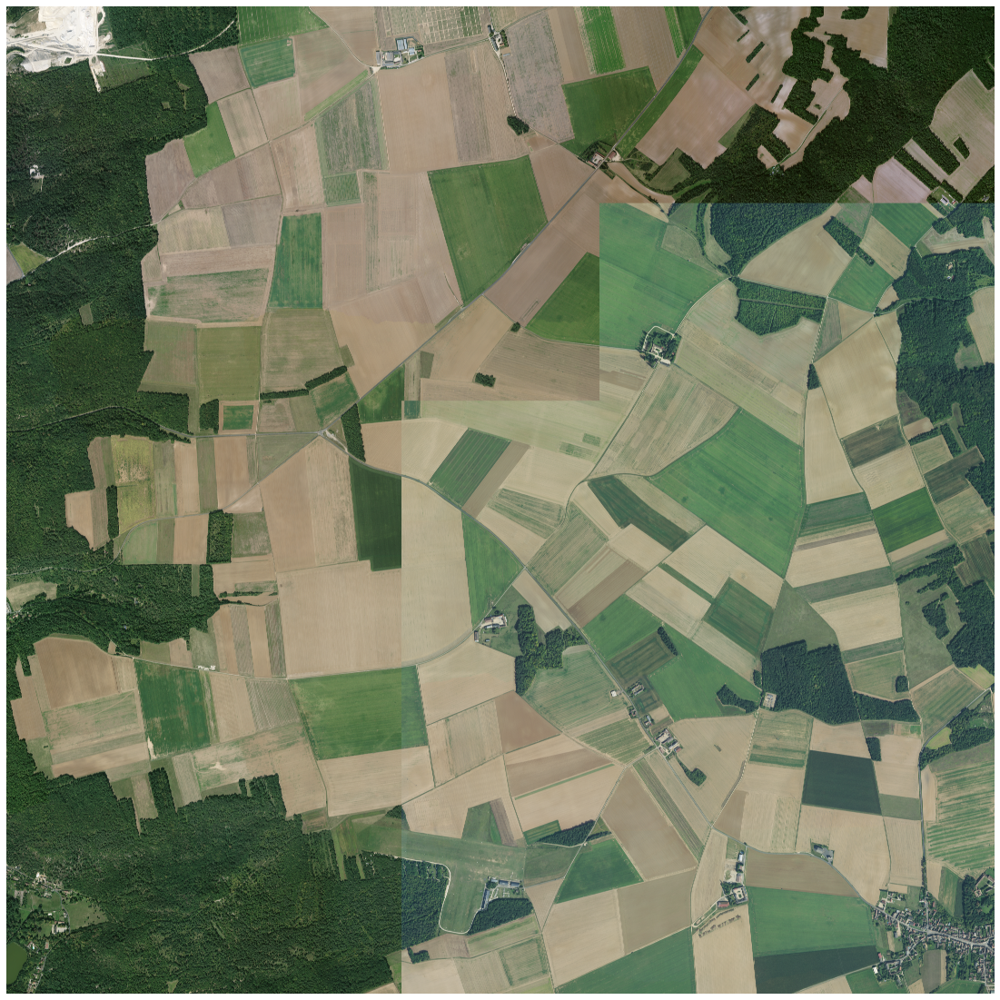

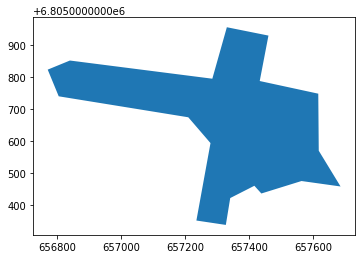

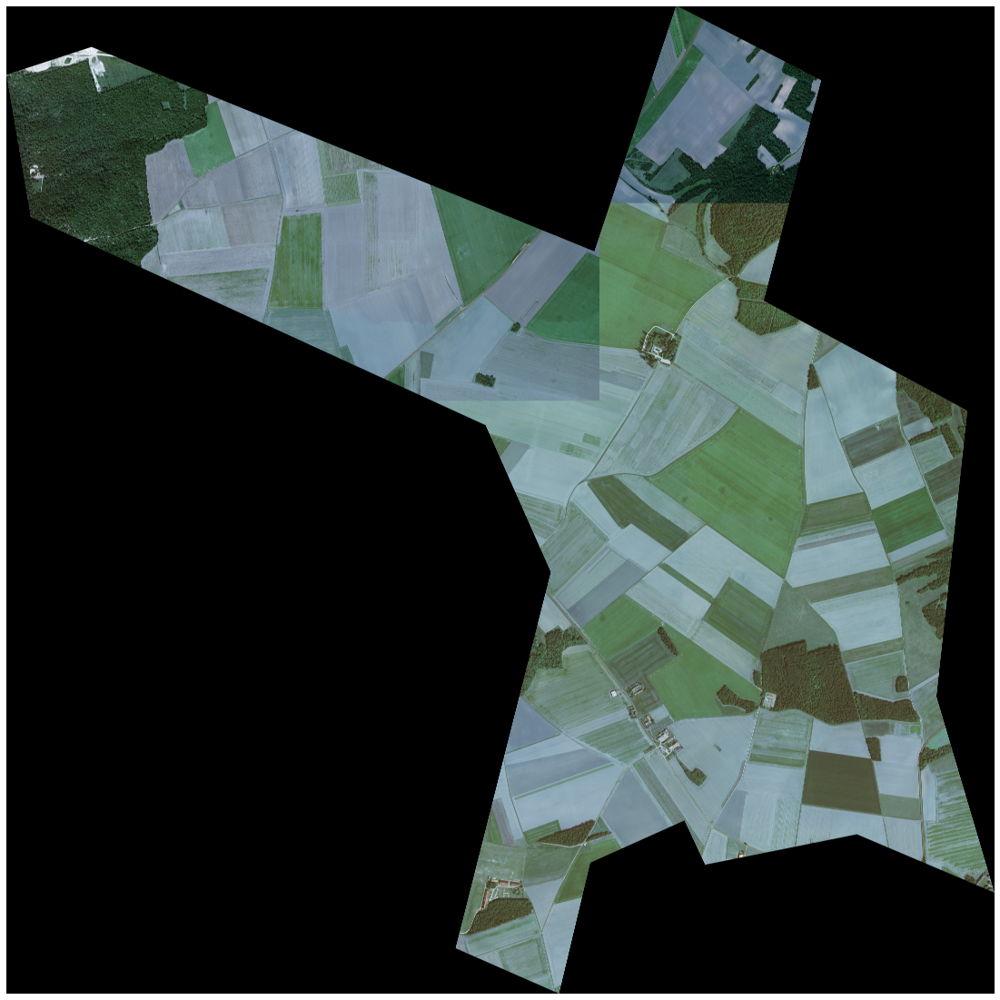

In [ ]:
# Here we try to apply our techniques to crop an airport into its corresponding image
# We use the lambert coordinates of an airport for the conversion and the file path of its corresponding original image(FRENCH ORTHO IMAGES)


example_file_path = "ORTHOHR/ORTHOHR_1-0_RVB-0M20_JP2-E080_LAMB93_D077_2017-01-01/ORTHOHR/1_DONNEES_LIVRAISON_2018-06-00155/OHR_RVB_0M20_JP2-E080_LAMB93_D77-2017/77-2017-0655-6810-LA93-0M20-E080.jp2"

source_blob_helper.download_file(container_name, example_file_path)

pixel_coordinates = lamb_to_pix(
    [
        (657327.300000008, 6805339.400001095),
        (657235.500000008, 6805353.100001094),
        (657279.500000008, 6805594.600001094),
        (657210.200000008, 6805675.100001093),
        (656806.1000000081, 6805740.500001093),
        (656771.8000000082, 6805823.7000010945),
        (656841.000000008, 6805852.100001091),
        (657285.200000008, 6805795.400001092),
        (657330.500000008, 6805955.900001093),
        (657460.2000000079, 6805929.900001094),
        (657433.0000000079, 6805788.200001093),
        (657615.6000000079, 6805748.700001093),
        (657617.1000000079, 6805570.800001094),
        (657685.1000000079, 6805459.300001094),
        (657563.300000008, 6805476.300001095),
        (657438.1000000079, 6805437.400001094),
        (657416.300000008, 6805461.500001094),
        (657341.000000008, 6805423.2000010945),
        (657327.300000008, 6805339.400001095),
    ]
)

example_file_path = "azure_tmp/" + example_file_path

display_image(example_file_path)

airports[airports["ID"] == "BDCAEROD0000000017183146"].plot()

image = cv2.imread(example_file_path)

# Define the coordinates of the polygon's vertices
polygon_vertices = np.array([pixel_coordinates], dtype=np.int32)

# Create a mask to isolate the region inside the polygon
mask = np.zeros_like(image)
cv2.fillPoly(mask, polygon_vertices, (255, 255, 255))


# Use the mask to extract the region of interest (ROI) from the image
cropped_image = cv2.bitwise_and(image, mask)

# Display the cropped image
display_image(cropped_image)

### II.2 - Extract runway images
**Objective:** Extract croped images of runways

**Deliverables:**
- Python code 
- Cropped images of runways

**Comments:**
You are given the following :
- Airports pictures
- Pixel localization of each corner of each runway
- Runway are expected to be vertically aligned

You are expected to use both to extract crops of runways.

Downloading airports_images/BDCAEROD0000000017182996_aéroport de calais-dunkerque.jpg to azure_tmp/airports_images/BDCAEROD0000000017182996_aéroport de calais-dunkerque.jpg

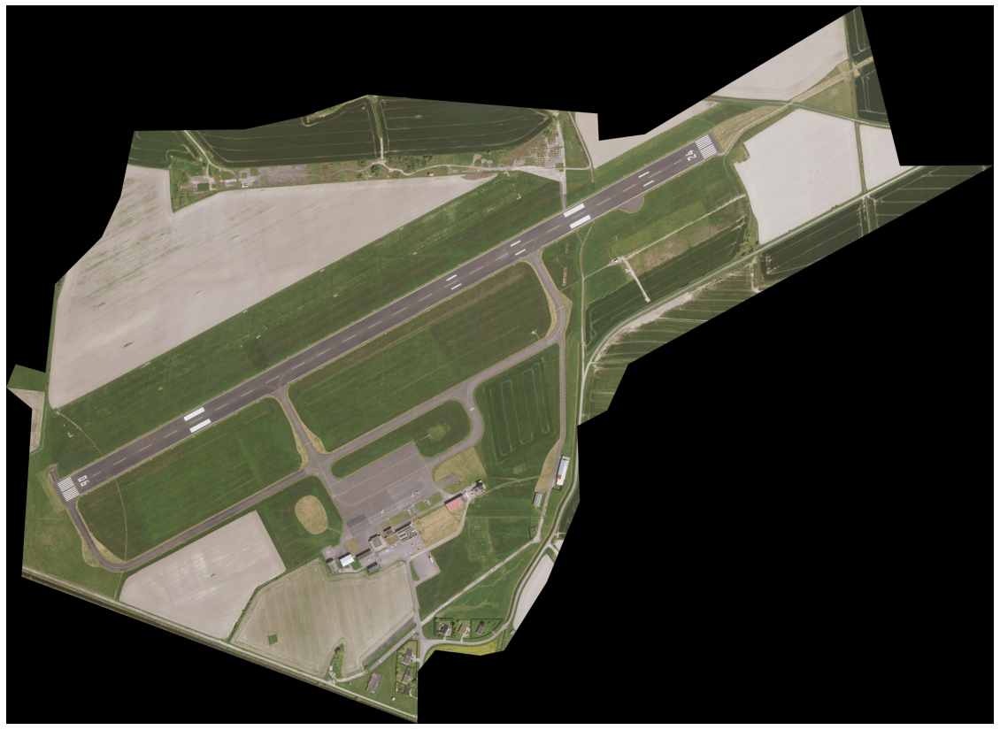

In [ ]:
airports_image_list = [
    filename
    for filename in source_blob_helper.get_list_blobs_name(
        container_name, prefix="airports_images/"
    )
    if filename.endswith(".jpg")
]
source_blob_helper.download_file(container_name, airports_image_list[4])
display_image(f"azure_tmp/{airports_image_list[4]}")

In [ ]:
runway_localization = source_blob_helper.get_file_as_pandas_df(
    container_name, "airports_metadata/runway_bounding_box_3.csv", delimiter=";"
)
display(runway_localization)
# Each box coordinates is a list of 4 points [x1, y1, ..., x4, y4] (pixel space)

ID,TOPONYME,RUNWAY_ID,BOX_COORDINATES,LABELIZER,COMMENT
BDCAEROD0000000017182985,aérodrome de dunkerque-les moëres,1,[],mohamed,piste en herbe
BDCAEROD0000000017182993,aéroport de merville-calonne,1,"[9146,895,9336,1041,880,11981,671,11820]",Tom,null
BDCAEROD0000000017182994,aéroport de lille-lesquin,1,"[4005,11562,3837,11519,5855,3875,6017,3915]",Tom,null
BDCAEROD0000000017182994,aéroport de lille-lesquin,2,"[3036,10145,2975,9884,17012,699516964,6761]",Tom,null
BDCAEROD0000000017182995,aérodrome de lille-marcq-en-barœul,1,[],Tom,piste en herbe
BDCAEROD0000000017182996,aéroport de calais-dunkerque,1,"[472,4929,593,5172,7404,1511,7276,1290]",Tom,null
BDCAEROD0000000017182997,aérodrome de saint-omer-wizernes,1,"[506, 1122, 511, 1276, 3712, 968, 3729, 1100]",Francois,null
BDCAEROD0000000017182998,aéroport du touquet-côte d'opale,1,"[7751,7589,7602,7753,48,317,222,167]",Tom,null
BDCAEROD0000000017183002,aérodrome de la salmagne,1,"[582,6126,482,5999,5383,1718,5274,1603]",Tom,null
BDCAEROD0000000017183003,aérodrome de valenciennes-denain,1,"[858,2337,953,2082,7880,4976,7950,4682]",mohamed,null


Expected result is the following :

![Runway](/files/hackathon/BDCAEROD0000000017183024_runway_1.jpg)

In [ ]:
# YOUR CODE HERE
# If you want to upload files to storage use destination blob helper
destination_blob_helper = BlobStorageExtended(destination_storage_connection_string)

# Usage
# destination_blob_helper.upload_file(container_name, local_file_name=.., remote_file_name=...)

Using path: [azure_tmp/] as local storage

In [ ]:
"""
airports_image_list = [filename for filename in source_blob_helper.get_list_blobs_name(container_name, prefix="airports_images/") if filename.endswith(".jpg")]

for i in range(len(airports_image_list)):
    source_blob_helper.download_file(container_name, airports_image_list[i])
    destination_blob_helper.upload_file(container_name, local_file_name="azure_tmp/"+airports_image_list[i], remote_file_name="hackathonbouyguesteam9/"+airports_image_list[i] )
"""

In [ ]:
runway_localization = runway_localization[
    runway_localization["BOX_COORDINATES"].apply(lambda x: x != "[]")
]

# Reset the index of the DataFrame
runway_localization.reset_index(drop=True, inplace=True)

runway_localization

Out[11]:

,ID,TOPONYME,RUNWAY_ID,BOX_COORDINATES,LABELIZER,COMMENT
0,BDCAEROD0000000017182993,aéroport de merville-calonne,1,"[9146,895,9336,1041,880,11981,671,11820]",Tom,NaN
1,BDCAEROD0000000017182994,aéroport de lille-lesquin,1,"[4005,11562,3837,11519,5855,3875,6017,3915]",Tom,NaN
2,BDCAEROD0000000017182994,aéroport de lille-lesquin,2,"[3036,10145,2975,9884,17012,699516964,6761]",Tom,NaN
3,BDCAEROD0000000017182996,aéroport de calais-dunkerque,1,"[472,4929,593,5172,7404,1511,7276,1290]",Tom,NaN
4,BDCAEROD0000000017182997,aérodrome de saint-omer-wizernes,1,"[506, 1122, 511, 1276, 3712, 968, 3729, 1100]",Francois,NaN
...,...,...,...,...,...,...
273,BDCAEROD0000000257739150,aérodrome de verchocq,1,"[75,1675,94,1727,2801,87,2835,137]",Tom,NaN
274,BDCAEROD0000000294454013,aéroport de dijon-longvic,1,"[10964,19200,11236,19184,9456,3600,9136,3644]",mohamed,NaN
275,BDCAEROD0000000294454013,aéroport de dijon-longvic,2,"[5250,12640,5472,12690,7546,3042,7796,3078]",mohamed,NaN
276,BDCAEROD0000000320074058,base aéronavale de rochefort,1,"[57,255,9,441,4170,2112,4233,1959]",Tom,NaN


In [ ]:
def extract_runway(airportID, airportName, coordinates):
    # airportID(str) is the ID of the airport in the runway_localization dataframe
    # airportName(str) is its name
    # Coordinates(list of 4 tuples) is the coordinates of the bounding box of the airport in runway_localization dataframe

    airport = airportID + "_" + airportName
    # Define the coordinates of the polygon's vertices
    polygon_vertices = np.array([coordinates], dtype=np.int32)

    source_blob_helper.download_file(
        container_name, "airports_images/" + airport + ".jpg"
    )
    display_image("azure_tmp/airports_images/" + airport + ".jpg")

    # Load the image
    image = cv2.imread("azure_tmp/airports_images/" + airport + ".jpg")

    # Create a mask to isolate the region inside the polygon
    mask = np.zeros_like(image)
    cv2.fillPoly(mask, polygon_vertices, (255, 255, 255))

    # Use the mask to extract the region of interest (ROI) from the image
    cropped_image = cv2.bitwise_and(image, mask)

    # Display the cropped image
    # display_image(cropped_image)

    # Load the numpy image (replace this with your actual image data)

    image = Image.fromarray(cropped_image)

    # Calculate the angle of rotation

    x1, y1 = coordinates[0]

    x2, y2 = coordinates[1]

    angle = (
        -math.atan2(x2 - x1, y2 - y1) * 180 / math.pi
    )  # Calculate the angle in degrees

    # Determine the minimum and maximum x and y coordinates

    x_min = min(coordinates, key=lambda x: x[0])[0]

    x_max = max(coordinates, key=lambda x: x[0])[0]

    y_min = min(coordinates, key=lambda x: x[1])[1]

    y_max = max(coordinates, key=lambda x: x[1])[1]

    # Extract the rectangle defined by the coordinates

    cropped_image = image.crop((x_min, y_min, x_max, y_max))

    # Rotate the cropped rectangle to make it vertical

    rotated_image = cropped_image.rotate(angle, expand=True).rotate(-90)

    # Display the rotated image (you can save it as well)

    # display_image(rotated_image)

    image_ = rotated_image

    # Create a binary mask to identify black pixels (where all color channels are zero)
    black_pixels = np.all(image_ == [0, 0, 0], axis=-1)

    # Create a mask to keep non-black pixels
    non_black_pixels = np.logical_not(black_pixels)

    # Apply the mask to the original image
    result = np.array(image_).copy()
    result[black_pixels] = [
        255,
        255,
        255,
    ]  # Replace black pixels with white (you can use any other color)

    # Save the result
    result_image = Image.fromarray(result)

    # Display the result (optional)
    # display_image(result_image)

    # Rmove black zones
    temp = np.array(result_image)
    cols_to_keep = [i for i in range(temp.shape[1]) if temp[:, i].sum() != 0]
    result_without_black_columns = temp[:, cols_to_keep]
    result_image_cropped = Image.fromarray(result_without_black_columns)
    display_image(result_image_cropped)

Downloading airports_images/BDCAEROD0000000017182993_aéroport de merville-calonne.jpg to azure_tmp/airports_images/BDCAEROD0000000017182993_aéroport de merville-calonne.jpg

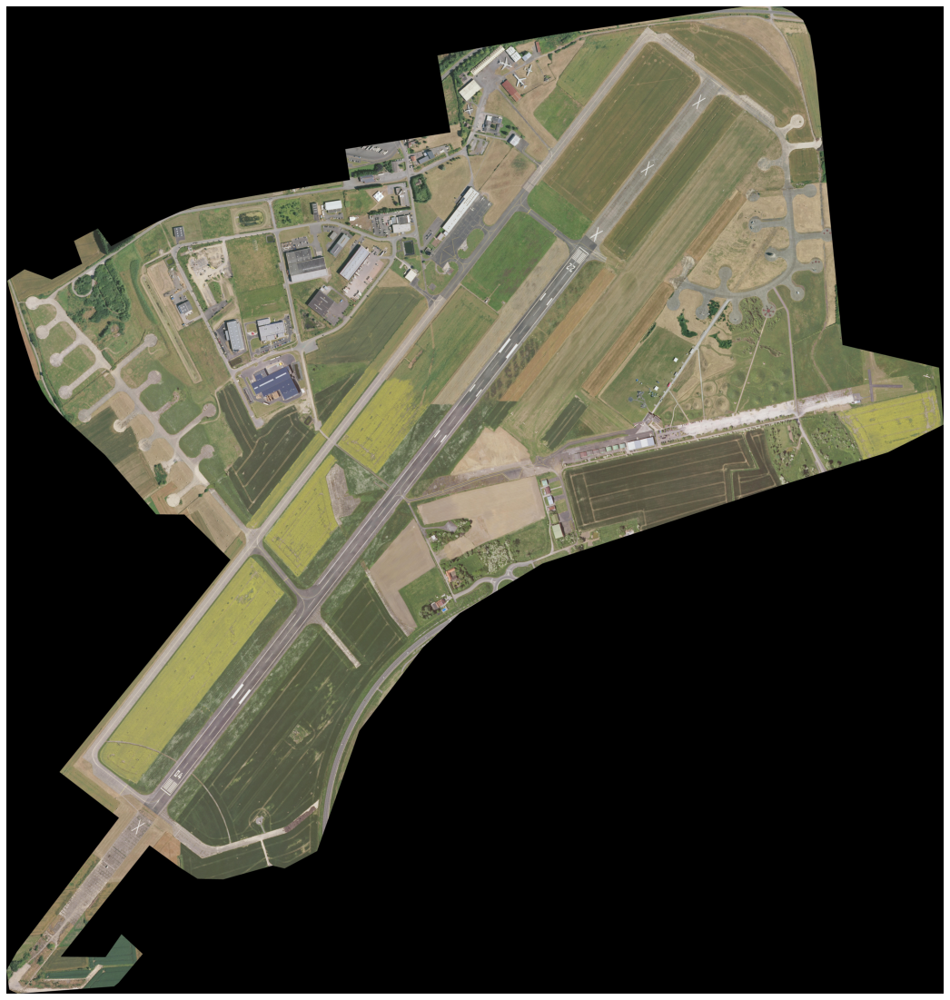

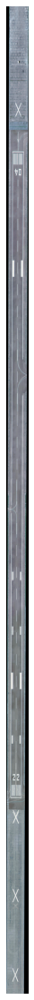

In [ ]:
airportID = "BDCAEROD0000000017182993"
airportName = "aéroport de merville-calonne"
coordinates = [(9146, 895), (9336, 1041), (880, 11981), (671, 11820)]

extract_runway(airportID, airportName, coordinates)

## III - Compute vision model

**Objective:** Train a computer vision model to classify damages on runways. A multi label model is required, as a picture can have several damages.

**Deliverables:**
- Python code 
- Model weights (Tensorflow or Pytorch)
- Model predictions on test set, following the suggested format.

**Comments:**
You are given the following :
- Training set : a set of images & a file describe damages for each of these files
- Test set & prediction template: a set of images on which apply your model & a template to insert your model predictions on test set.

You are expected to train a computer vision model using the training set and use it to predict damages on the test set.

In [ ]:
training_images = source_blob_helper.get_list_blobs_name(
    container_name, prefix="dataset/train"
)
training_labels = source_blob_helper.get_file_as_pandas_df(
    container_name, "dataset/labels_train.csv"
)
display(training_labels)

filename,FISSURE,REPARATION,FISSURE LONGITUDINALE,FAÏENCAGE,MISE EN DALLE
BDCAEROD0000000017183099_runway_3_gridsize_512_idx_7_idy_0.jpg,0,0,1,1,0
BDCAEROD0000000017183055_runway_1_gridsize_512_idx_9_idy_0.jpg,0,0,1,0,0
BDCAEROD0000000017183118_runway_1_gridsize_512_idx_7_idy_0.jpg,1,0,1,0,0
BDCAEROD0000000017183028_runway_1_gridsize_512_idx_12_idy_0.jpg,1,0,0,0,0
BDCAEROD0000000017183088_runway_1_gridsize_512_idx_9_idy_0.jpg,0,0,0,0,0
BDCAEROD0000000017183117_runway_1_gridsize_512_idx_4_idy_0.jpg,0,0,0,0,0
BDCAEROD0000000017183103_runway_2_gridsize_512_idx_30_idy_0.jpg,1,1,1,0,1
BDCAEROD0000000017183045_runway_1_gridsize_512_idx_5_idy_0.jpg,0,0,1,0,0
BDCAEROD0000000017183019_runway_1_gridsize_512_idx_13_idy_0.jpg,0,0,0,0,0
BDCAEROD0000000017183103_runway_1_gridsize_512_idx_16_idy_0.jpg,0,0,0,0,0


In [ ]:
test_images = source_blob_helper.get_list_blobs_name(
    container_name, prefix="dataset/test"
)
test_template = source_blob_helper.get_file_as_pandas_df(
    container_name, "dataset/template_test.csv"
)

In [ ]:
display(test_template)  # Add 1 where model predict the damage

filename,FISSURE,REPARATION,FISSURE LONGITUDINALE,FAÏENCAGE,MISE EN DALLE
BDCAEROD0000000017183099_runway_2_gridsize_512_idx_17_idy_0.jpg,0,0,0,0,0
BDCAEROD0000000017183016_runway_1_gridsize_512_idx_5_idy_0.jpg,0,0,0,0,0
BDCAEROD0000000017183040_runway_1_gridsize_512_idx_16_idy_0.jpg,0,0,0,0,0
BDCAEROD0000000017183010_runway_1_gridsize_512_idx_4_idy_0.jpg,0,0,0,0,0
BDCAEROD0000000017183107_runway_2_gridsize_512_idx_6_idy_0.jpg,0,0,0,0,0
BDCAEROD0000000017183057_runway_1_gridsize_512_idx_4_idy_0.jpg,0,0,0,0,0
BDCAEROD0000000017183073_runway_1_gridsize_512_idx_17_idy_0.jpg,0,0,0,0,0
BDCAEROD0000000017183057_runway_1_gridsize_512_idx_2_idy_0.jpg,0,0,0,0,0
BDCAEROD0000000017183096_runway_1_gridsize_512_idx_1_idy_0.jpg,0,0,0,0,0
BDCAEROD0000000017183017_runway_1_gridsize_512_idx_8_idy_0.jpg,0,0,0,0,0


In [ ]:
# YOUR CODE HERE
# If you want to upload files to storage use destination blob helper
destination_blob_helper = BlobStorageExtended(destination_storage_connection_string)

# Usage
# destination_blob_helper.upload_file(container_name, local_file_name=.., remote_file_name=...)

Using path: [azure_tmp/] as local storage

# Data Exploration

In [ ]:
# get the training images and stop as numpy arrays

train_numpy_images = [
    source_blob_helper.get_image_as_numpy_array(container_name, image)
    for image in training_images
]
test_numpy_images = [
    source_blob_helper.get_image_as_numpy_array(container_name, image)
    for image in test_images
]

In [ ]:
# convert the training labels to a dataframe and sort the dataframe in the same order of the list, so the images are correctly alligned with their labels

training_labels_df = pd.DataFrame(training_labels)
# Create a custom sorting order based on the list of contents
sorting_order = {content[14:]: order for order, content in enumerate(training_images)}
# Apply the sorting order to the DataFrame
training_labels_df["sorting_order"] = training_labels_df["filename"].map(sorting_order)
# Sort the DataFrame based on the sorting order
training_labels_df = training_labels_df.sort_values(by="sorting_order").drop(
    "sorting_order", axis=1
)
# Reset the index
training_labels_df = training_labels_df.reset_index(drop=True)
training_labels_df.head()

Out[15]:

,filename,FISSURE,REPARATION,FISSURE LONGITUDINALE,FAÏENCAGE,MISE EN DALLE
0,BDCAEROD0000000017182993_runway_1_gridsize_512...,0,0,0,0,0
1,BDCAEROD0000000017182993_runway_1_gridsize_512...,1,0,0,0,0
2,BDCAEROD0000000017182993_runway_1_gridsize_512...,0,0,0,0,0
3,BDCAEROD0000000017182993_runway_1_gridsize_512...,0,0,0,0,0
4,BDCAEROD0000000017182993_runway_1_gridsize_512...,0,0,0,0,0


In [ ]:
testing_labels_df = pd.DataFrame(test_template)
# Create a custom sorting order based on the list of contents
sorting_order = {content[13:]: order for order, content in enumerate(test_images)}
# Apply the sorting order to the DataFrame
testing_labels_df["sorting_order"] = testing_labels_df["filename"].map(sorting_order)
# Sort the DataFrame based on the sorting order
testing_labels_df = testing_labels_df.sort_values(by="sorting_order").drop(
    "sorting_order", axis=1
)
# Reset the index
testing_labels_df = testing_labels_df.reset_index(drop=True)

In [ ]:
# check if the dataframe follow the same order as the training_images list
index = 15
training_labels_df.filename[index] == training_images[index][14:]

Out[17]: True

In [ ]:
# check the number of labels by row, Ex: 5 if the 5 labels are 1, and 0 if the 5 labels are 0
print(training_labels_df[training_labels_df.columns[:-1]].sum(axis=1).value_counts())

0 482
1 150
2 128
3 56
4 14
dtype: int64

La cellule ci-dessus montre que 482, soit environ 60 % des données d'apprentissage, contiennent des zéros partout, ce qui indique qu'il n'y a pas de défaut dans les pistes de les aéroports et que nous devons donc sous-échantillonner la classe majoritaire et suréchantillonner les classes minoritaires.

# Data Preparation 

## Over/Undersampling the data (Data Augmentation/ diminution) and Resizing

Il y a de 25 classes des données differents: ex:<br>
labels:<br>
- 0 0 0 0 0
- 0 0 0 0 1
- 0 0 0 1 1
- . . . . .
- . . . . .
- 1 1 1 1 1 <br>
Et comme nous l'avons vu dans la partie exploration, les distributions des classes ne sont pas égales. Nous devons donc augmenter le nombre d'images des classes mal représentées dans les données et diminuer le nombre d'images qui sont massivement surreprésentées en tant que classe (0 0 0 0 0). <br>
<br>
En vérifiant le nombre d'images par classe, nous visons ensuite à avoir 150 images pour les classes suréchantillonnées et à augmenter les classes sous-échantillonnées à 100-150 images.

In [ ]:
# Resize the images
new_width = 224
new_height = 224
train_resized_images = [
    cv2.resize(image_array, (new_width, new_height)).astype(np.uint8)
    for image_array in train_numpy_images
]
test_resized_images = [
    cv2.resize(image_array, (new_width, new_height)).astype(np.uint8)
    for image_array in test_numpy_images
]

In [ ]:
Xtrain = np.array(train_resized_images)
Xtest = np.array(test_resized_images)
Ytrain = np.array(training_labels_df[training_labels_df.columns[1:]])

In [ ]:
# Example data (replace with your own images and labels)
def augment_data(X_train, Y_train, target_undersample, target_oversample):
    """
    Augmente les données en fonction des cibles de sous-échantillonnage et de sur-échantillonnage spécifiées.

    Args:
        X_train (numpy.ndarray): Tableau NumPy contenant les données d'images.
        Y_train (numpy.ndarray): Tableau NumPy contenant les étiquettes associées.
        target_undersample (int): Nombre cible pour le sous-échantillonnage.
        target_oversample (int): Nombre cible pour le sur-échantillonnage.

    Returns:
        tuple: Un tuple contenant deux tableaux NumPy. Le premier tableau contient les données d'images
               augmentées, et le second tableau contient les étiquettes associées.

    Exemple d'utilisation:
        target_undersample = 100
        target_oversample = 150
        X_train_augmented, Y_train_augmented = augment_data(X_train, Y_train, target_undersample, target_oversample)
    """

    # Initialize empty lists to collect augmented data
    X_train_augmented = []
    Y_train_augmented = []

    # Get unique label combinations
    unique_combinations = np.unique(Y_train, axis=0)

    # Initialize the ImageDataGenerator for data augmentation
    datagen = ImageDataGenerator(
        rotation_range=20,
        width_shift_range=0.2,
        height_shift_range=0.2,
        horizontal_flip=True,
        fill_mode="nearest",
    )

    # Iterate through unique label combinations
    for labels_combination in unique_combinations:
        # Count the occurrences of the label combination in the original data
        count = np.sum(np.all(Y_train == labels_combination, axis=1))

        # If the label combination is underrepresented, oversample it
        if count < target_undersample:
            # Select the original images with this label combination
            selected_images = X_train[np.all(Y_train == labels_combination, axis=1)]

            # Calculate the number of additional images needed
            oversample_count = target_undersample - count

            # Augment and add the additional images
            for i in range(oversample_count):
                augmented_image = datagen.random_transform(selected_images[i % count])
                X_train_augmented.append(augmented_image)
                Y_train_augmented.append(labels_combination)

        # If the label combination is overrepresented, reduce it to the target count
        elif count > 2 * target_oversample:
            # Select the original images with this label combination
            selected_images = X_train[np.all(Y_train == labels_combination, axis=1)]

            # Randomly select the first target_oversample images
            selected_images = selected_images[:target_oversample]

            # Add the selected images to the augmented data
            for image in selected_images:
                X_train_augmented.append(image)
                Y_train_augmented.append(labels_combination)

    # Convert the lists to NumPy arrays
    X_train_augmented = np.array(X_train_augmented)
    Y_train_augmented = np.array(Y_train_augmented)

    return X_train_augmented, Y_train_augmented


# Example usage:
target_undersample = 100
target_oversample = 150
X_train_augmented, Y_train_augmented = augment_data(
    Xtrain, Ytrain, target_undersample, target_oversample
)


target_labels = {
    "CRACK": Y_train_augmented[:, 0],
    "REPAIR": Y_train_augmented[:, 1],
    "LONGITUDINAL_CRACK": Y_train_augmented[:, 2],
    "TILING": Y_train_augmented[:, 3],
    "SLABBING": Y_train_augmented[:, 4],
}

# Convert the dictionary into a pandas DataFrame
Y_train_augmented = pd.DataFrame(target_labels)
print("Numero totale d'images avant l'augmentation: ", Xtrain.shape[0])
print("Numero totale d'images après l'augmentation: ", X_train_augmented.shape[0])

Numero totale d'images avant l'augmentation: 830
Numero totale d'images après l'augmentation: 1898

## Training a pretrained CNN (Res-Net 50)

In [ ]:
input_shape = X_train_augmented.shape
# # Split the training data into training and validation sets
X_train, X_val, Y_train, Y_val = train_test_split(
    X_train_augmented, Y_train_augmented, test_size=0.2, random_state=42
)

In [ ]:
os.environ["PROTOCOL_BUFFERS_PYTHON_IMPLEMENTATION"] = "python"
os.environ["CUDA_VISIBLE_DEVICES"] = "0"  # Utiliser le premier GPU

In [ ]:
def predict_targets(
    X_train, Y_train, X_val, Y_val, target_variables, num_epochs=10, batch_size=32
):
    """
    Train and predict binary labels for specified target variables using ResNet50.

    Args:
        X_train (numpy.ndarray): Training set images.
        Y_train (pandas.DataFrame): Training set labels (each column represents a target variable).
        X_val (numpy.ndarray): Validation set images.
        Y_val (pandas.DataFrame): Validation set labels (each column represents a target variable).
        target_variables (list): List of target variable names to predict.
        num_epochs (int): Number of training epochs (default: 10).
        batch_size (int): Batch size for training (default: 32).

    Returns:
        dict: A dictionary where keys are target variable names, and values are arrays of predictions.
    """

    # Load the pre-trained ResNet50 model
    base_model = ResNet50(
        weights="imagenet", include_top=False, input_shape=(224, 224, 3)
    )

    # Create a dictionary to store predictions for each target variable
    target_predictions = {}
    trained_models = []
    for target_variable in target_variables:
        # Extract the last convolutional layer's output (feature vector)
        x = base_model.output
        x = tf.keras.layers.GlobalAveragePooling2D()(x)

        # Add an output layer with sigmoid activation for the current target variable
        predictions = Dense(1, activation="sigmoid", name=f"output_{target_variable}")(
            x
        )

        # Create a new model with the input from the ResNet model and the output layer
        model = Model(inputs=base_model.input, outputs=predictions)

        # Compile the model
        model.compile(optimizer="adam", loss="binary_crossentropy", metrics=[AUC()])

        # Get the current target labels
        y_train = Y_train[target_variable].values
        y_val = Y_val[target_variable].values

        # Train the model
        model.fit(
            X_train,
            y_train,
            epochs=num_epochs,
            batch_size=batch_size,
            validation_data=(X_val, y_val),
        )

        # Use the model to predict the binary labels for the current target variable
        predictions = model.predict(X_val)

        # Store the predictions in the dictionary
        target_predictions[target_variable] = predictions
        trained_models.append(model)

    return target_predictions, trained_models


# Example usage:
target_variables = ["CRACK", "REPAIR", "LONGITUDINAL_CRACK", "TILING", "SLABBING"]
predictions, ResNetModel = predict_targets(
    X_train_augmented,
    Y_train_augmented,
    X_val,
    Y_val,
    target_variables,
    num_epochs=10,
    batch_size=32,
)

Downloading data from https://storage.googleapis.com/tensorflow/keras-applications/resnet/resnet50_weights_tf_dim_ordering_tf_kernels_notop.h5
 16384/94765736 [..............................] - ETA: 3:06 32768/94765736 [..............................] - ETA: 4:17 65536/94765736 [..............................] - ETA: 3:34 81920/94765736 [..............................] - ETA: 4:09 139264/94765736 [..............................] - ETA: 3:00 196608/94765736 [..............................] - ETA: 2:38 278528/94765736 [..............................] - ETA: 2:09 458752/94765736 [..............................] - ETA: 1:29 655360/94765736 [..............................] - ETA: 1:09 1015808/94765736 [..............................] - ETA: 49s  1507328/94765736 [..............................] - ETA: 36s 2252800/94765736 [..............................] - ETA: 26s 3383296/94765736 [>.............................] - ETA: 18s 5111808/94765736 [>.............................] - ETA: 12s 7651328/94765736 [=>............................] - ETA: 8s  9617408/94765736 [==>...........................] - ETA: 7s11943936/94765736 [==>...........................] - ETA: 6s13950976/94765736 [===>..........................] - ETA: 5s16392192/94765736 [====>.........................] - ETA: 4s18530304/94765736 [====>.........................] - ETA: 4s20561920/94765736 [=====>........................] - ETA: 3s23216128/94765736 [======>.......................] - ETA: 3s24920064/94765736 [======>.......................] - ETA: 3s25870336/94765736 [=======>......................] - ETA: 3s29261824/94765736 [========>.....................] - ETA: 2s30326784/94765736 [========>.....................] - ETA: 2s33112064/94765736 [=========>....................] - ETA: 2s34537472/94765736 [=========>....................] - ETA: 2s35487744/94765736 [==========>...................] - ETA: 2s38731776/94765736 [===========>..................] - ETA: 2s39845888/94765736 [===========>..................] - ETA: 2s43016192/94765736 [============>.................] - ETA: 2s

In [ ]:
predictions = {key: value.flatten().tolist() for key, value in predictions.items()}
predictions_df = pd.DataFrame(predictions)

In [ ]:
predictions_df.head()

Out[26]:

,CRACK,REPAIR,LONGITUDINAL_CRACK,TILING,SLABBING
0,0.623084,0.114185,0.635058,1.147095e-01,0.003772
1,0.000190,0.999470,0.001083,9.775690e-01,0.000044
2,0.925111,0.016202,0.758453,4.308429e-02,0.110023
3,0.637289,0.000004,0.000452,1.276852e-06,0.979118
4,0.055500,0.677815,0.011498,7.280146e-07,0.000642


In [ ]:
training_labels_df.columns

Out[27]: Index(['filename', 'FISSURE', 'REPARATION', 'FISSURE LONGITUDINALE',
 'FAÏENCAGE', 'MISE EN DALLE'],
 dtype='object')

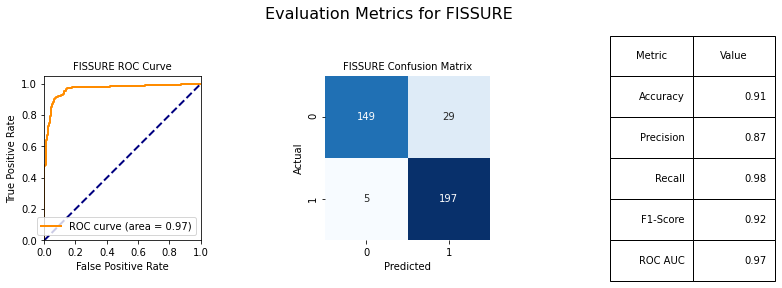

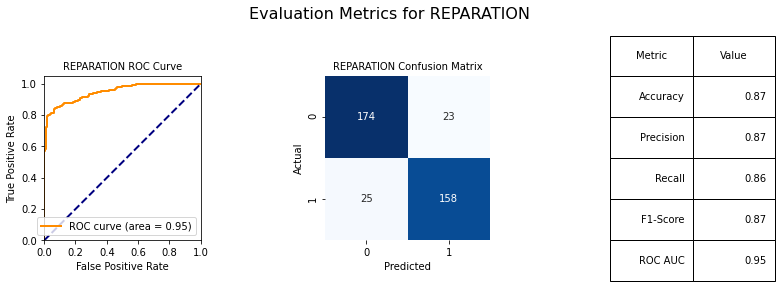

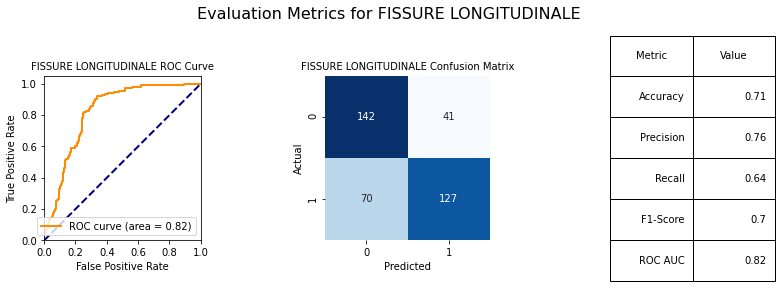

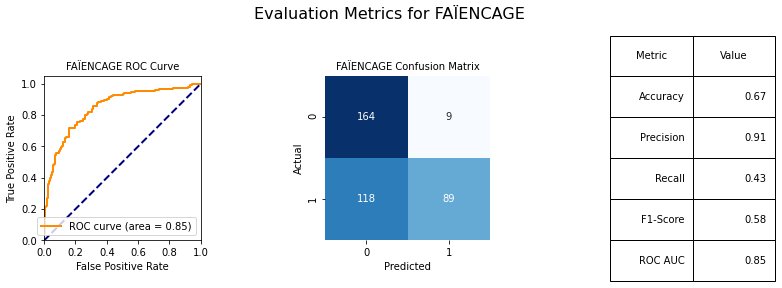

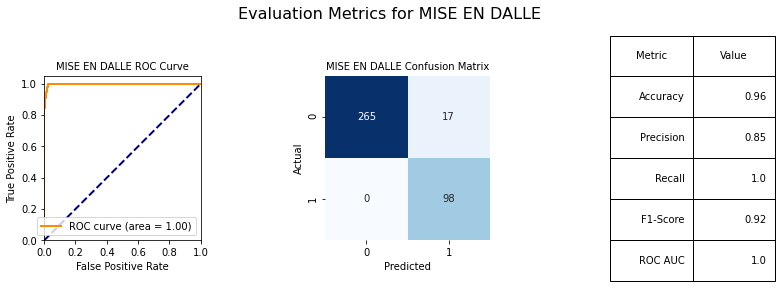

In [ ]:
# Assuming 'predictions' is a dictionary where each key corresponds to a target variable
# and the values are arrays of continuous predictions between 0 and 1.

# Given the DataFrame with predicted probabilities (predictions_df)
target_variables = ["CRACK", "REPAIR", "LONGITUDINAL_CRACK", "TILING", "SLABBING"]
french_variables = [
    "FISSURE",
    "REPARATION",
    "FISSURE LONGITUDINALE",
    "FAÏENCAGE",
    "MISE EN DALLE",
]

# Create a dictionary to store predictions for each target variable
predictions_ = {}

for target_variable in target_variables:
    predicted_probabilities = predictions_df[target_variable].values
    index = target_variables.index(target_variable)
    # Create a new figure
    fig, axes = plt.subplots(
        1, 3, figsize=(12, 4)
    )  # Three columns for ROC, heatmap, and metrics

    # Threshold predictions to 0 or 1 based on a threshold of 0.5
    predicted_labels = np.where(predicted_probabilities >= 0.5, 1, 0)
    true_labels = Y_val[target_variable].values

    # Accuracy
    accuracy = accuracy_score(true_labels, predicted_labels)

    # Precision, Recall, and F1-Score
    precision = precision_score(true_labels, predicted_labels)
    recall = recall_score(true_labels, predicted_labels)
    f1 = f1_score(true_labels, predicted_labels)

    # ROC Curve and AUC
    fpr, tpr, _ = roc_curve(true_labels, predicted_probabilities)
    roc_auc = auc(fpr, tpr)

    # Confusion Matrix
    cm = confusion_matrix(true_labels, predicted_labels)

    # Plot ROC Curve
    axes[0].plot(
        fpr,
        tpr,
        color="darkorange",
        lw=2,
        label="ROC curve (area = {:.2f})".format(roc_auc),
    )
    axes[0].plot([0, 1], [0, 1], color="navy", lw=2, linestyle="--")
    axes[0].set_xlim([0.0, 1.0])
    axes[0].set_ylim([0.0, 1.05])
    axes[0].set_aspect("equal")  # Make the plot square
    axes[0].set_xlabel("False Positive Rate")
    axes[0].set_ylabel("True Positive Rate")
    axes[0].set_title(f"{french_variables[index]} ROC Curve", fontsize=10)
    axes[0].legend(loc="lower right")

    # Plot Confusion Matrix as a heatmap
    labels = [
        "True Negative (TN)",
        "False Positive (FP)",
        "False Negative (FN)",
        "True Positive (TP)",
    ]
    categories = ["0", "1"]
    cm_df = pd.DataFrame(cm, index=categories, columns=categories)
    sns.heatmap(
        cm_df, annot=True, fmt="d", cmap="Blues", ax=axes[1], cbar=False
    )  # Remove color bar
    axes[1].set_aspect("equal")  # Make the plot square
    axes[1].set_title(f"{french_variables[index]} Confusion Matrix", fontsize=10)
    axes[1].set_xlabel("Predicted")
    axes[1].set_ylabel("Actual")

    # Plot Metrics Table
    metric_table_data = {
        "Metric": ["Accuracy", "Precision", "Recall", "F1-Score", "ROC AUC"],
        "Value": [accuracy, precision, recall, f1, roc_auc],
    }
    metric_table_df = pd.DataFrame(metric_table_data).round(2)
    table = axes[2].table(
        cellText=metric_table_df.values, colLabels=metric_table_df.columns, loc="center"
    )
    axes[2].set_aspect("equal")  # Make the table square
    axes[2].axis("off")
    table.auto_set_font_size(False)
    table.set_fontsize(10)
    table.scale(1, 4.5)  # Adjust the table size
    # axes[2].set_title(f'{french_variables[index]} Metrics', fontsize=10)

    # Add a title to the entire figure
    plt.suptitle(f"Evaluation Metrics for {french_variables[index]}", fontsize=16)

    # Use tight_layout for better spacing within each subplot
    plt.tight_layout()

    # Show the entire figure for the current target variable
    plt.show()

In [ ]:
# Create a DataFrame 'Y_pred' with concatenated predictions
unpacked_predictions = {key: value for key, value in predictions.items()}

# Create a DataFrame from the unpacked predictions
Y_pred = pd.DataFrame(unpacked_predictions)
# Threshold predictions to 0 or 1 based on a threshold of 0.5
Y_pred = (Y_pred >= 0.5).astype(int)

# Calculate evaluation metrics between Y_pred and Y_val
precision = precision_score(Y_val, Y_pred, average="micro")
recall = recall_score(Y_val, Y_pred, average="micro")
f1 = f1_score(Y_val, Y_pred, average="micro")

print("Precision:", round(precision, 2))
print("Recall:", round(recall, 2))
print("F1-Score:", round(f1, 2))

Precision: 0.85
Recall: 0.75
F1-Score: 0.8

## Test set prediction

In [ ]:
def predict_labels(models, X_test, threshold=0.5):
    """
    Predict binary labels (0 or 1) using a list of models and a specified threshold.

    Args:
        models (list): List of trained models.
        X_test (numpy.ndarray): Test set images.
        threshold (float): Threshold for mapping sigmoid outputs to 0 or 1 (default: 0.5).

    Returns:
        numpy.ndarray: Predicted binary labels for all models.
    """
    Y_pred = []

    for model in models:
        predictions = model.predict(X_test)
        # Apply threshold to map sigmoid outputs to 0 or 1
        binary_predictions = (predictions >= threshold).astype(int)
        Y_pred.append(binary_predictions)

    return np.concatenate(Y_pred, axis=1)


Y_pred = predict_labels(ResNetModel, Xtest, threshold=0.5)

In [ ]:
final_test_df = testing_labels_df[["filename"]].copy()
# Assuming Y_pred is the N*5 array containing predicted labels.
# Add the predicted values to the new DataFrame.
final_test_df["FISSURE"] = Y_pred[:, 0]
final_test_df["REPARATION"] = Y_pred[:, 1]
final_test_df["FISSURE LONGITUDINALE"] = Y_pred[:, 2]
final_test_df["FAÏENCAGE"] = Y_pred[:, 3]
final_test_df["MISE EN DALLE"] = Y_pred[:, 4]
final_test_df.head()

Out[31]:

,filename,FISSURE,REPARATION,FISSURE LONGITUDINALE,FAÏENCAGE,MISE EN DALLE
0,BDCAEROD0000000017182993_runway_1_gridsize_512...,1,0,1,0,0
1,BDCAEROD0000000017182993_runway_1_gridsize_512...,1,1,1,1,0
2,BDCAEROD0000000017182993_runway_1_gridsize_512...,1,1,1,1,0
3,BDCAEROD0000000017182993_runway_1_gridsize_512...,1,1,1,1,0
4,BDCAEROD0000000017182993_runway_1_gridsize_512...,1,1,0,0,1


In [ ]:
final_test_df.to_csv("final_test_df.csv", index=False)

In [ ]:
destination_blob_helper.upload_file(
    container_name,
    local_file_name="final_test_df.csv",
    remote_file_name="Partie_3_test_set_filled.csv",
)

In [ ]:
# destination_blob_helper.upload_file(container_name, local_file_name="final_test_df.csv", remote_file_name="hackathonbouyguesteam9/final_test_df.csv")

In [ ]:
for i in range(len(ResNetModel)):
    ResNetModel[i].save_weights(f"model_{training_labels_df.columns[i+1]}.h5")
for i in range(len(ResNetModel)):
    #     destination_blob_helper.upload_file(container_name, local_file_name=f"model_{training_labels_df.columns[i+1]}.h5", remote_file_name="hackathonbouyguesteam9/"+f"model_{training_labels_df.columns[i+1]}.h5")

    destination_blob_helper.upload_file(
        container_name,
        local_file_name=f"model_{training_labels_df.columns[i+1]}.h5",
        remote_file_name=f"Partie_3_model_{training_labels_df.columns[i+1]}.h5",
    )

## Power BI extract for airport quality

In [ ]:
power_bi_quality_extract = pd.concat([training_labels_df, final_test_df])
power_bi_quality_extract.head()

Out[35]:

,filename,FISSURE,REPARATION,FISSURE LONGITUDINALE,FAÏENCAGE,MISE EN DALLE
0,BDCAEROD0000000017182993_runway_1_gridsize_512...,0,0,0,0,0
1,BDCAEROD0000000017182993_runway_1_gridsize_512...,1,0,0,0,0
2,BDCAEROD0000000017182993_runway_1_gridsize_512...,0,0,0,0,0
3,BDCAEROD0000000017182993_runway_1_gridsize_512...,0,0,0,0,0
4,BDCAEROD0000000017182993_runway_1_gridsize_512...,0,0,0,0,0


In [ ]:
runway_localization = source_blob_helper.get_file_as_pandas_df(
    container_name, "airports_metadata/runway_bounding_box_3.csv", delimiter=";"
)
runway_localization_df = pd.DataFrame(runway_localization)[
    ["ID", "TOPONYME", "RUNWAY_ID"]
]
runway_localization_df.head()

Out[36]:

,ID,TOPONYME,RUNWAY_ID
0,BDCAEROD0000000017182985,aérodrome de dunkerque-les moëres,1
1,BDCAEROD0000000017182993,aéroport de merville-calonne,1
2,BDCAEROD0000000017182994,aéroport de lille-lesquin,1
3,BDCAEROD0000000017182994,aéroport de lille-lesquin,2
4,BDCAEROD0000000017182995,aérodrome de lille-marcq-en-barœul,1


In [ ]:
power_bi_quality_extract["filename_short"] = (
    power_bi_quality_extract["filename"].str.split("_").str[0]
)
power_bi_quality_extract.head()

Out[37]:

,filename,FISSURE,REPARATION,FISSURE LONGITUDINALE,FAÏENCAGE,MISE EN DALLE,filename_short
0,BDCAEROD0000000017182993_runway_1_gridsize_512...,0,0,0,0,0,BDCAEROD0000000017182993
1,BDCAEROD0000000017182993_runway_1_gridsize_512...,1,0,0,0,0,BDCAEROD0000000017182993
2,BDCAEROD0000000017182993_runway_1_gridsize_512...,0,0,0,0,0,BDCAEROD0000000017182993
3,BDCAEROD0000000017182993_runway_1_gridsize_512...,0,0,0,0,0,BDCAEROD0000000017182993
4,BDCAEROD0000000017182993_runway_1_gridsize_512...,0,0,0,0,0,BDCAEROD0000000017182993


In [ ]:
power_bi_quality_extract = power_bi_quality_extract.merge(
    runway_localization_df[["ID", "TOPONYME", "RUNWAY_ID"]],
    how="left",
    left_on="filename_short",
    right_on="ID",
)[
    [
        "ID",
        "TOPONYME",
        "FISSURE",
        "REPARATION",
        "FISSURE LONGITUDINALE",
        "FAÏENCAGE",
        "MISE EN DALLE",
    ]
].drop_duplicates()
power_bi_quality_extract.head()

Out[38]:

,ID,TOPONYME,FISSURE,REPARATION,FISSURE LONGITUDINALE,FAÏENCAGE,MISE EN DALLE
0,BDCAEROD0000000017182993,aéroport de merville-calonne,0,0,0,0,0
1,BDCAEROD0000000017182993,aéroport de merville-calonne,1,0,0,0,0
7,BDCAEROD0000000017182993,aéroport de merville-calonne,1,0,1,0,1
12,BDCAEROD0000000017182993,aéroport de merville-calonne,1,0,1,1,1
18,BDCAEROD0000000017182994,aéroport de lille-lesquin,0,0,0,0,0


In [ ]:
power_bi_quality_extract["QUALITY"] = power_bi_quality_extract[
    ["FISSURE", "REPARATION", "FISSURE LONGITUDINALE", "FAÏENCAGE", "MISE EN DALLE"]
].sum(axis=1)
# create a list with values good, bad ,and medium if the QUALITY value is <2 bad , >3 good, else medium
power_bi_quality_extract["QUALITY_class"] = [
    "Mauvais" if x > 3 else "Bon" if x < 2 else "A surveiller"
    for x in power_bi_quality_extract["QUALITY"]
]
# clean list
list_of_clean_names = []
for name in power_bi_quality_extract["TOPONYME"]:
    try:
        for i in range(name.split()):
            if i == "de" or i == "du":
                name = name.split(i)
    except:
        pass
    list_of_clean_names.append(name)
power_bi_quality_extract["TOPONYME_clean"] = list_of_clean_names
power_bi_quality_extract.head()

Out[39]:

,ID,TOPONYME,FISSURE,REPARATION,FISSURE LONGITUDINALE,FAÏENCAGE,MISE EN DALLE,QUALITY,QUALITY_class,TOPONYME_clean
0,BDCAEROD0000000017182993,aéroport de merville-calonne,0,0,0,0,0,0,Bon,aéroport de merville-calonne
1,BDCAEROD0000000017182993,aéroport de merville-calonne,1,0,0,0,0,1,Bon,aéroport de merville-calonne
7,BDCAEROD0000000017182993,aéroport de merville-calonne,1,0,1,0,1,3,A surveiller,aéroport de merville-calonne
12,BDCAEROD0000000017182993,aéroport de merville-calonne,1,0,1,1,1,4,Mauvais,aéroport de merville-calonne
18,BDCAEROD0000000017182994,aéroport de lille-lesquin,0,0,0,0,0,0,Bon,aéroport de lille-lesquin


In [ ]:
list_of_IDs = []
power_bi_quality_extract["piste_id"] = (
    power_bi_quality_extract.groupby("ID").cumcount() + 1
)
power_bi_quality_extract.head()

Out[46]:

,ID,TOPONYME,FISSURE,REPARATION,FISSURE LONGITUDINALE,FAÏENCAGE,MISE EN DALLE,QUALITY,QUALITY_class,TOPONYME_clean,piste_id
0,BDCAEROD0000000017182993,aéroport de merville-calonne,0,0,0,0,0,0,Bon,aéroport de merville-calonne,1
1,BDCAEROD0000000017182993,aéroport de merville-calonne,1,0,0,0,0,1,Bon,aéroport de merville-calonne,2
7,BDCAEROD0000000017182993,aéroport de merville-calonne,1,0,1,0,1,3,A surveiller,aéroport de merville-calonne,3
12,BDCAEROD0000000017182993,aéroport de merville-calonne,1,0,1,1,1,4,Mauvais,aéroport de merville-calonne,4
18,BDCAEROD0000000017182994,aéroport de lille-lesquin,0,0,0,0,0,0,Bon,aéroport de lille-lesquin,1


In [ ]:
power_bi_quality_extract.to_csv(
    "power_bi_quality_extract_.csv", index=False, encoding="utf-8-sig"
)

In [ ]:
destination_blob_helper.upload_file(
    container_name,
    local_file_name="power_bi_quality_extract_.csv",
    remote_file_name="hackathonbouyguesteam9/power_bi_quality_extract_.csv",
)